Columns in merged_data: Index(['order_datetime', 'origin_longitude', 'origin_latitude', 'm_order_eta',
       'order_gk', 'order_status_key', 'is_driver_assigned_key',
       'cancellations_time_in_seconds', 'offer_id'],
      dtype='object')
Column 'cancellation_time_in_seconds' is missing in the merged dataset.


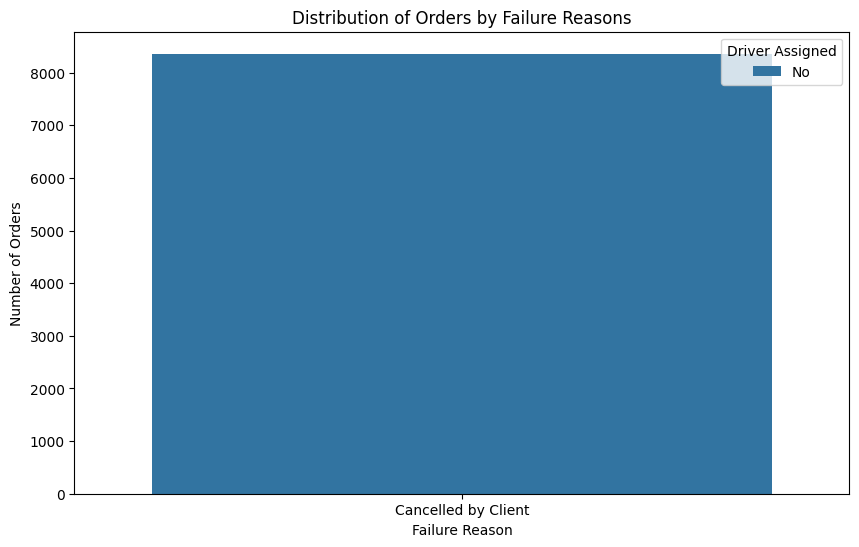

/var/folders/vg/pl6b7mc51j30tl7x990chf_c0000gn/T/ipykernel_87429/1632777474.py:61: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  merged_data['order_hour'] = pd.to_datetime(merged_data['order_datetime']).dt.hour


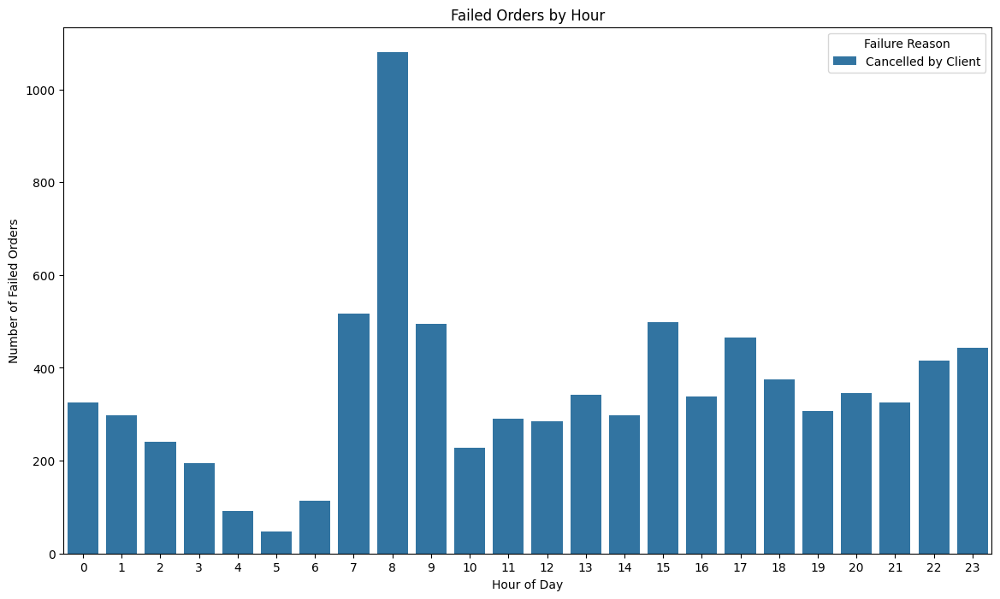

/Users/ghulom97/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/Users/ghulom97/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


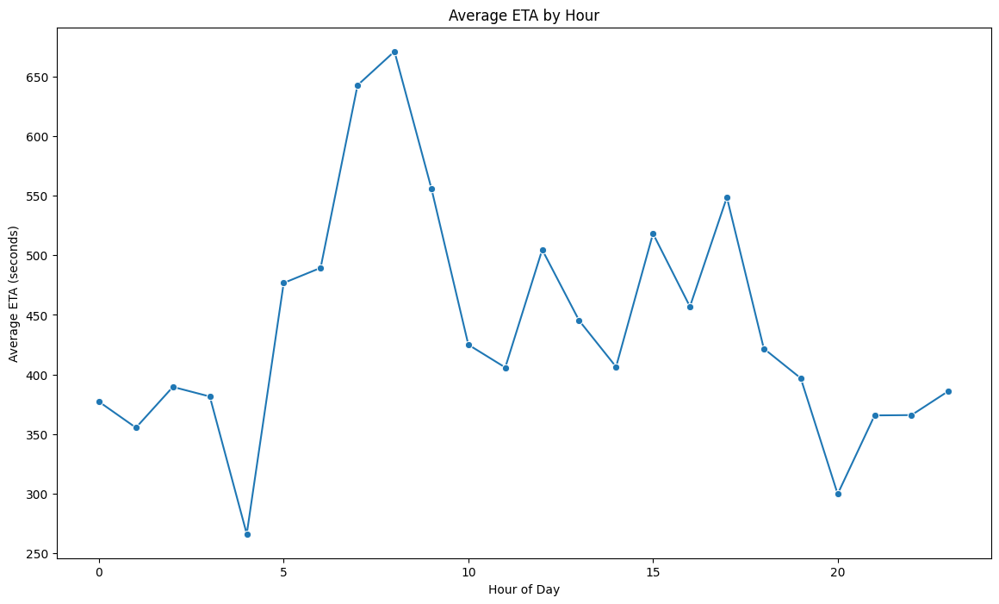

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Load the datasets
data_orders = pd.read_csv('/Users/ghulom97/Downloads/datasets 2/data_orders.csv')
data_offers = pd.read_csv('/Users/ghulom97/Downloads/datasets 2/data_offers.csv')

# Merge the datasets on 'order_gk'
merged_data = pd.merge(data_orders, data_offers, on='order_gk', how='left')

# Drop rows with any missing values for simplicity
merged_data = merged_data.dropna()

# Print columns of merged_data to confirm presence
print("Columns in merged_data:", merged_data.columns)

# Check if 'cancellation_time_in_seconds' column exists
if 'cancellation_time_in_seconds' in merged_data.columns:
    # Handle outliers in 'cancellation_time_in_seconds' using the IQR method
    Q1 = merged_data['cancellation_time_in_seconds'].quantile(0.25)
    Q3 = merged_data['cancellation_time_in_seconds'].quantile(0.75)
    IQR = Q3 - Q1

    # Define outlier boundaries
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR

    # Filter out outliers
    merged_data = merged_data[(merged_data['cancellation_time_in_seconds'] >= lower_bound) &
                              (merged_data['cancellation_time_in_seconds'] <= upper_bound)]

    # Calculate average time to cancellation with and without driver by hour
    avg_cancellation_time = merged_data.groupby(['order_hour', 'is_driver_assigned_key'])['cancellation_time_in_seconds'].mean().reset_index()

    # Plot the average time to cancellation
    plt.figure(figsize=(14, 8))
    sns.lineplot(data=avg_cancellation_time, x='order_hour', y='cancellation_time_in_seconds', hue='is_driver_assigned_key', marker='o')
    plt.title('Average Time to Cancellation by Hour')
    plt.xlabel('Hour of Day')
    plt.ylabel('Average Cancellation Time (seconds)')
    plt.legend(title='Driver Assigned', labels=['No', 'Yes'])
    plt.show()
else:
    print("Column 'cancellation_time_in_seconds' is missing in the merged dataset.")

# Map order_status_key to reasons
status_mapping = {4: 'Cancelled by Client', 9: 'Cancelled by System'}
merged_data['failure_reason'] = merged_data['order_status_key'].map(status_mapping)

# Plot the distribution of orders by failure reasons
plt.figure(figsize=(10, 6))
sns.countplot(data=merged_data, x='failure_reason', hue='is_driver_assigned_key')
plt.title('Distribution of Orders by Failure Reasons')
plt.xlabel('Failure Reason')
plt.ylabel('Number of Orders')
plt.legend(title='Driver Assigned', labels=['No', 'Yes'])
plt.show()

# Extract hour from order_datetime
merged_data['order_hour'] = pd.to_datetime(merged_data['order_datetime']).dt.hour

# Plot the distribution of failed orders by hours
plt.figure(figsize=(14, 8))
sns.countplot(data=merged_data, x='order_hour', hue='failure_reason')
plt.title('Failed Orders by Hour')
plt.xlabel('Hour of Day')
plt.ylabel('Number of Failed Orders')
plt.legend(title='Failure Reason')
plt.show()

# Calculate average ETA by hour
avg_eta_by_hour = merged_data.groupby('order_hour')['m_order_eta'].mean().reset_index()

# Plot the distribution of average ETA by hours
plt.figure(figsize=(14, 8))
sns.lineplot(data=avg_eta_by_hour, x='order_hour', y='m_order_eta', marker='o')
plt.title('Average ETA by Hour')
plt.xlabel('Hour of Day')
plt.ylabel('Average ETA (seconds)')
plt.show()


In [ ]:
import pandas as pd
import folium

# Load the datasets
data_orders = pd.read_csv('/Users/ghulom97/Downloads/datasets 2/data_orders.csv')
data_offers = pd.read_csv('/Users/ghulom97/Downloads/datasets 2/data_offers.csv')

# Merge the datasets on 'order_gk'
merged_data = pd.merge(data_orders, data_offers, on='order_gk', how='left')

# Drop rows with any missing values for simplicity
merged_data = merged_data.dropna()

# Debugging: Check unique values of 'order_status_key'
print("Unique order_status_key values:", merged_data['order_status_key'].unique())

# Filter orders based on cancellation status
canceled_orders = merged_data[merged_data['order_status_key'] == 4]  # Canceled by client
uncanceled_orders = merged_data[~merged_data['order_status_key'].isin([4, 9])]  # Not canceled or rejected

# Debugging: Check the number of orders in each category
print("Number of canceled orders:", len(canceled_orders))
print("Number of uncanceled orders:", len(uncanceled_orders))

# Create a folium map centered at the mean latitude and longitude of the orders
map_center = [merged_data['origin_latitude'].mean(), merged_data['origin_longitude'].mean()]
m = folium.Map(location=map_center, zoom_start=12)

# Add markers for canceled orders
for _, row in canceled_orders.iterrows():
    folium.Marker(
        location=[row['origin_latitude'], row['origin_longitude']],
        icon=folium.Icon(color='red', icon='times', prefix='fa'),
        popup=f'Order {row["order_gk"]}: Canceled'
    ).add_to(m)

# Add markers for uncanceled orders
for _, row in uncanceled_orders.iterrows():
    folium.Marker(
        location=[row['origin_latitude'], row['origin_longitude']],
        icon=folium.Icon(color='green', icon='check', prefix='fa'),
        popup=f'Order {row["order_gk"]}: Uncanceled'
    ).add_to(m)

# Save the map to an HTML file
m.save('orders_map.html')

# Display the map (for environments that support it)
m


Unique order_status_key values: [4]
Number of canceled orders: 8360
Number of uncanceled orders: 0
